# 상관관계 분석 기반 이상치 분류
- 상관관계 분석결과 train test 간의 패턴이 확연하게 달라진 모습을 볼수 있음
- 원인은 test에 이상치가 굉장히 많기 때문에 그런것으로 추측함
- 시뮬레이션 단위로 이상이 발생하기 때문에 하나의 시뮬레이션 패턴을 한개의 데이터라고 생각
    - 1번 시뮬레이션런이 이상치일경우 해당 런이 포함하는 1000개의 sample모두 이상치
    - 그렇다면 시뮬레이션 단위로 상관관계 분석을 했을 경우 정상과 다른 패턴을 보일 것으로 파악
- train 데이터라는 확실한 정상 기준이 있기 때문에 해당 상관관계 계수를 기반으로 test내 각각의 시뮬레이션 상관관계 계수를 비교
    - 계수간에 차이가 임계값 이상 차이날 경우 해당 시뮬레이션 데이터를 모두 이상치로 분류하도록 설계

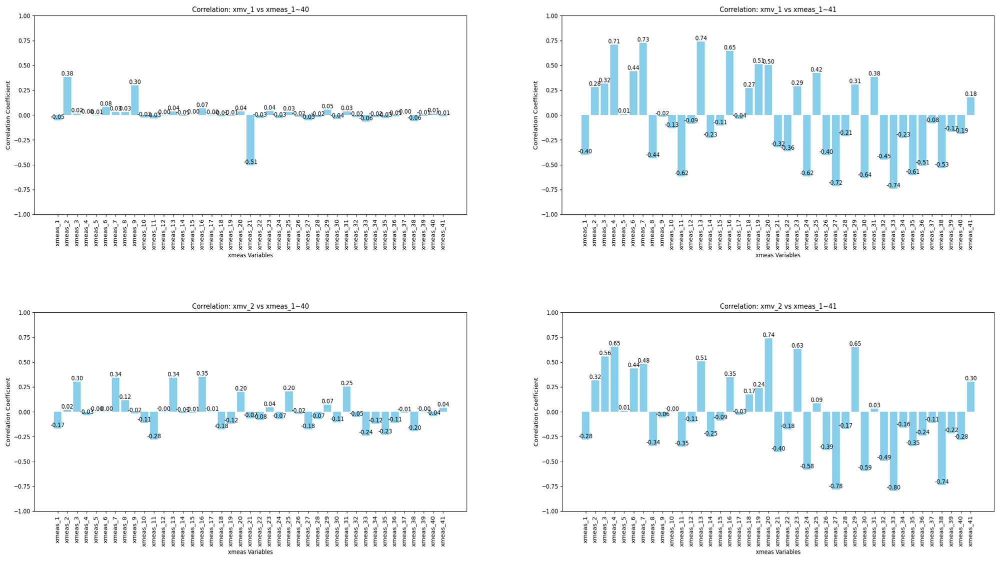

In [13]:
from typing import Union
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly
from plotly.subplots import make_subplots
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.io as pio

# 데이터가 많아 plotly로 시각화시 인터렉션 활성화시 팅김 주의!!!! 특히 test데이터는 더더욱
config = {
    'staticPlot': True,  # 인터랙션 비활성화 (호버, 확대/축소 등)
}



In [2]:
DATA_PATH = Path("C:/Users/lim/Desktop/upstage AI/AD_project/data")
train_data = pd.read_csv(DATA_PATH / "train.csv")
test_data = pd.read_csv(DATA_PATH / "test.csv")
def process_data(df) -> pd.DataFrame:
    numeric_cols = [
        'xmeas_1', 'xmeas_2', 'xmeas_3', 'xmeas_4', 'xmeas_5', 'xmeas_6',
        'xmeas_7', 'xmeas_8', 'xmeas_9', 'xmeas_10', 'xmeas_11', 'xmeas_12',
        'xmeas_13', 'xmeas_14', 'xmeas_15', 'xmeas_16', 'xmeas_17', 'xmeas_18',
        'xmeas_19', 'xmeas_20', 'xmeas_21', 'xmeas_22', 'xmeas_23', 'xmeas_24',
        'xmeas_25', 'xmeas_26', 'xmeas_27', 'xmeas_28', 'xmeas_29', 'xmeas_30',
        'xmeas_31', 'xmeas_32', 'xmeas_33', 'xmeas_34', 'xmeas_35', 'xmeas_36',
        'xmeas_37', 'xmeas_38', 'xmeas_39', 'xmeas_40', 'xmeas_41', 'xmv_1',
        'xmv_2', 'xmv_3', 'xmv_4', 'xmv_5', 'xmv_6', 'xmv_7', 'xmv_8',
        'xmv_9', 'xmv_10', 'xmv_11', 'simulationRun'
    ]
    return df[numeric_cols]
train_a = process_data(train_data)
test_a = process_data(test_data)

df_cleaned = train_a.drop(columns=['simulationRun'])


In [3]:
normal_corr = df_cleaned.corr()
simulation_groups = test_a.groupby('simulationRun')

# 패턴이 다른 시뮬레이션을 저장할 리스트
different_simulations = []

# 시뮬레이션 별로 상관관계 분석 및 정상 데이터와 비교
for sim_id, group in simulation_groups:
    group_cleaned = group.drop(columns=['simulationRun'])  # 필요없는 열 제거
    sim_corr = group_cleaned.corr()  # 시뮬레이션 별 상관관계 행렬 계산
    print(sim_corr)
    # 정상 데이터 상관관계와 시뮬레이션 상관관계의 차이를 절대값으로 계산
    corr_diff = np.abs(normal_corr - sim_corr)
    
    # 차이가 임계값을 넘는 시뮬레이션을 찾기 (예: 0.3 이상의 차이)
    threshold = 0.4125
    if (corr_diff > threshold).any().any():
        different_simulations.append(sim_id)

# 패턴이 다른 시뮬레이션 출력
print("패턴이 다른 시뮬레이션들:", different_simulations)

           xmeas_1   xmeas_2   xmeas_3   xmeas_4   xmeas_5   xmeas_6  \
xmeas_1   1.000000 -0.083705 -0.146291 -0.147316  0.043904  0.100317   
xmeas_2  -0.083705  1.000000  0.010311  0.000699  0.013038  0.079545   
xmeas_3  -0.146291  0.010311  1.000000 -0.094058 -0.039612  0.014959   
xmeas_4  -0.147316  0.000699 -0.094058  1.000000 -0.056838  0.093229   
xmeas_5   0.043904  0.013038 -0.039612 -0.056838  1.000000 -0.018735   
xmeas_6   0.100317  0.079545  0.014959  0.093229 -0.018735  1.000000   
xmeas_7  -0.229497  0.059402  0.397764  0.159612 -0.048838  0.057790   
xmeas_8  -0.015868  0.015940  0.107635 -0.188519  0.063077 -0.015450   
xmeas_9   0.104999  0.304317 -0.009294  0.005724  0.009565  0.009216   
xmeas_10  0.135875 -0.057139 -0.171490  0.110971  0.015966  0.057640   
xmeas_11  0.255291 -0.037707 -0.283706 -0.022321  0.039937 -0.070478   
xmeas_12  0.044546 -0.006073 -0.029457 -0.019260 -0.001707  0.024935   
xmeas_13 -0.243614  0.066536  0.398626  0.168770 -0.058293  0.05

In [4]:
# 패턴 다른 시뮬레이션런 개수
len(different_simulations)

216

In [5]:
test_a['faultNumber'] = test_a['simulationRun'].apply(lambda x: 1 if x in different_simulations else 0)

# 결과 출력 (필요에 따라 결과를 확인)
print(test_a[['simulationRun', 'faultNumber']].drop_duplicates())

        simulationRun  faultNumber
0                 151            0
960                13            0
1920              179            1
2880              580            0
3840              192            0
...               ...          ...
705600             30            1
706560            209            0
707520             72            1
708480            128            0
709440            438            1

[740 rows x 2 columns]


In [6]:
prit = test_a[['faultNumber']] 
prit.to_csv("corr_4125.csv", index=True)

threshold = 0.4 일때 f1_스코어가 가장 높았으며, 0.9138로 높은 성능을 보여줌

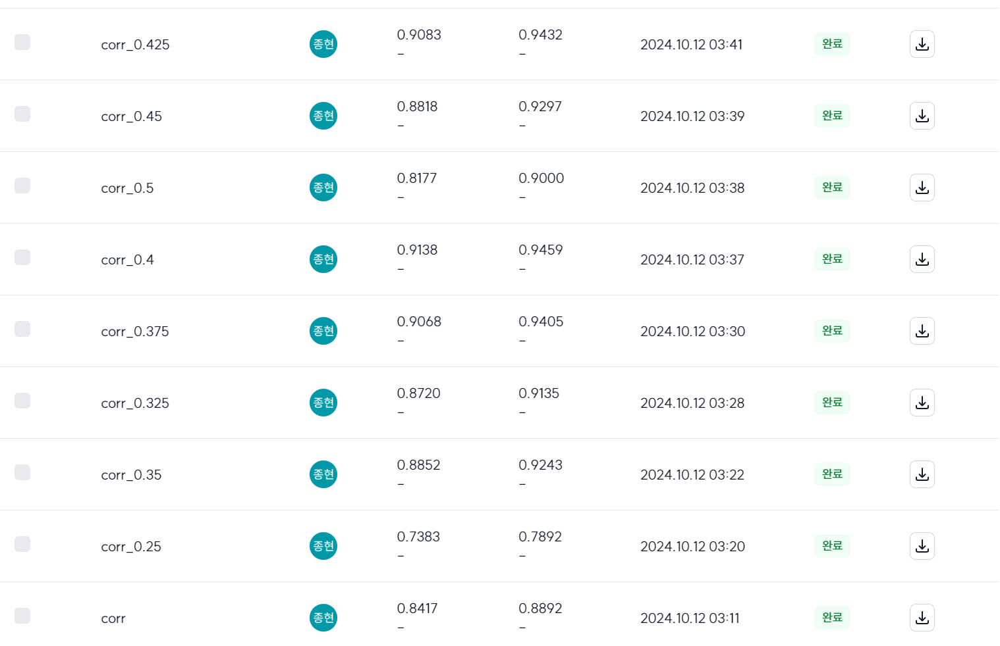


In [7]:
test_a

,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,xmeas_8,xmeas_9,xmeas_10,...,xmv_4,xmv_5,xmv_6,xmv_7,xmv_8,xmv_9,xmv_10,xmv_11,simulationRun,faultNumber
0,0.24927,3629.5,4517.9,9.3652,26.986,42.606,2705.0,75.255,120.41,0.33775,...,62.495,22.050,39.9870,38.451,47.832,47.427,40.319000,16.011,151,0
1,0.25248,3667.9,4513.8,9.4400,26.811,42.131,2704.3,75.795,120.41,0.33964,...,58.961,21.920,39.7560,36.490,50.014,47.059,41.286000,20.370,151,0
2,0.25116,3634.7,4480.6,9.4904,27.234,42.224,2704.3,74.874,120.38,0.33801,...,60.385,22.270,39.9540,33.784,50.440,47.592,41.210000,16.036,151,0
3,0.24815,3649.7,4493.3,9.1957,27.102,42.115,2704.1,75.118,120.39,0.33556,...,63.593,22.068,40.2530,32.951,45.397,47.591,41.183000,15.611,151,0
4,0.23961,3705.7,4487.8,9.2651,26.790,42.391,2703.9,75.370,120.41,0.32149,...,61.476,21.861,38.2170,33.422,45.579,47.524,41.701000,16.618,151,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
710395,0.00000,3620.4,4334.5,9.6099,26.940,42.337,3000.0,74.383,120.40,0.20767,...,100.000,100.020,1.7372,39.055,45.394,100.410,-0.025274,18.598,438,1
710396,0.00000,3620.4,4334.5,9.6099,26.940,42.337,3000.0,74.383,120.40,0.20767,...,100.000,100.020,0.0000,39.055,45.394,100.410,-0.025311,18.594,438,1
710397,0.00000,3620.4,4334.5,9.6099,26.940,42.337,3000.0,74.383,120.40,0.20767,...,100.000,100.020,0.0000,39.055,45.394,100.410,-0.025349,18.589,438,1
710398,0.00000,3620.4,4334.5,9.6099,26.940,42.337,3000.0,74.383,120.40,0.20767,...,100.000,100.020,1.7723,39.055,45.394,100.410,-0.025386,18.584,438,1


In [9]:
X = test_a.drop(columns=['faultNumber','simulationRun'])
pca = PCA(n_components=2)  # 2차원으로 축소
X_PCA = pca.fit_transform(X)

In [11]:
pca_df = pd.DataFrame(X_PCA, columns=['PCA_1', 'PCA_2'])
pca_df['faultNumber'] = test_a['faultNumber']  # faultNumber 추가

In [15]:
# 서브플롯 생성 (1행 2열)
fig = make_subplots(rows=1, cols=2, subplot_titles=("Fault 0", "Fault 1"))

# faultNumber == 0 그래프 추가
fig.add_trace(go.Scatter(
    x=pca_df[pca_df['faultNumber'] == 0]['PCA_1'],
    y=pca_df[pca_df['faultNumber'] == 0]['PCA_2'],
    mode='markers',
    marker=dict(size=8, color='blue', symbol='circle'),
    name='Fault 0'
), row=1, col=1)  # 첫 번째 서브플롯

# faultNumber == 1 그래프 추가
fig.add_trace(go.Scatter(
    x=pca_df[pca_df['faultNumber'] == 1]['PCA_1'],
    y=pca_df[pca_df['faultNumber'] == 1]['PCA_2'],
    mode='markers',
    marker=dict(size=8, color='red', symbol='x'),
    name='Fault 1'
), row=1, col=2)  # 두 번째 서브플롯

# 레이아웃 설정
fig.update_layout(
    title='PCA Scatter Plots by Fault Number',
    width=1000, height=500,
    showlegend=False  # 개별 범례 숨김
)

# 그래프 표시

filename = f"PCA_corr.png"
fig.write_image(filename, scale=3)

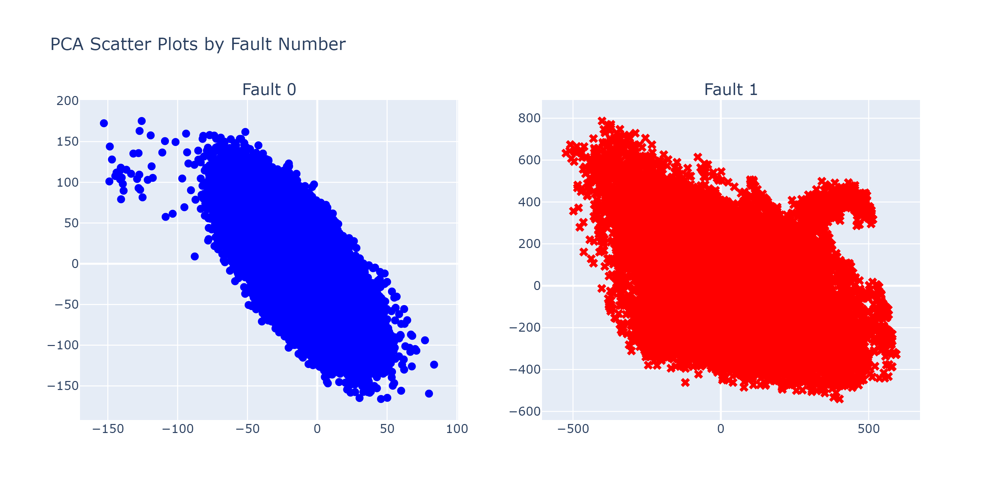

- 이상치가 전반적으로 퍼져있어 샘플 단위의 데이터나 컴럼 단위로 보는 거보다는 전체적인 패턴을 파악하는게 좋을 것으로 보임
- 정상 데이터중 확연하게 떨어져 나간 부분은 어떻게 처리할지 추가 고민중
